# **Introduction**

Metrocar is a (fictional) ride-sharing app - similar to Uber/Lyft.<br>
Our main goal is to perform a funnel analysis of our users to identify areas for improvement and optimization.


In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from plotly import graph_objects as go
import plotly.express as px

pd.options.display.max_columns = None
pd.options.display.max_rows = None

In [5]:
# Convert tables/csv into dataframes

app_downloads = pd.read_csv('app_downloads.csv')
reviews = pd.read_csv('reviews.csv')
ride_requests = pd.read_csv('ride_requests.csv')
signups = pd.read_csv('signups.csv')
transactions = pd.read_csv('transactions.csv')

In [3]:
# Checking columns name in each dataframe

print(f'app_dowloads columns: {app_downloads.columns} \n')
print(f'reviews columns: {reviews.columns} \n')
print(f'ride_requests columns: {ride_requests.columns} \n')
print(f'signups columns: {signups.columns} \n')
print(f'transactions columns: {transactions.columns} \n')

app_dowloads columns: Index(['Unnamed: 0', 'app_download_key', 'platform', 'download_ts'], dtype='object') 

reviews columns: Index(['Unnamed: 0', 'review_id', 'ride_id', 'user_id', 'driver_id', 'rating',
       'review'],
      dtype='object') 

ride_requests columns: Index(['Unnamed: 0', 'ride_id', 'user_id', 'driver_id', 'request_ts',
       'accept_ts', 'pickup_location', 'dropoff_location', 'pickup_ts',
       'dropoff_ts', 'cancel_ts'],
      dtype='object') 

signups columns: Index(['Unnamed: 0', 'user_id', 'session_id', 'signup_ts', 'age_range'], dtype='object') 

transactions columns: Index(['Unnamed: 0', 'transaction_id', 'ride_id', 'purchase_amount_usd',
       'charge_status', 'transaction_ts'],
      dtype='object') 



# EDA

In [6]:
# Checking shapes for each dataframe

print(f'app_dowloads columns: {app_downloads.shape}')
print(f'reviews columns: {reviews.shape}')
print(f'ride_requests columns: {ride_requests.shape}')
print(f'signups columns: {signups.shape}')
print(f'transactions columns: {transactions.shape}')

app_dowloads columns: (23608, 4)
reviews columns: (156211, 7)
ride_requests columns: (385477, 11)
signups columns: (17623, 5)
transactions columns: (223652, 6)


In [ ]:
# How many times was the app downloaded?

app_downloads['app_download_key'].nunique()

23608

In [ ]:
# How many rides were requested and how many unique users requested a ride?

signup_ride_requests = signups.merge(ride_requests, how='left', on='user_id', copy=True)

condition = signup_ride_requests ['request_ts'].isna() == False

print(signup_ride_requests['request_ts'].count())
print(signup_ride_requests[condition]['user_id'].nunique())

385477
12406


In [ ]:
# How many users signed up on the app?

signups['session_id'].nunique()

17623

In [ ]:
# we have roughly 5000 users who are not using the app which represents almost 1/3 of the users

diff_sign_up_usage = abs(12406 - 17623)
diff_sign_up_usage / 17623 * 100

29.603359246439314

In [ ]:
# How many rides were requested and completed through the app? - Here we see a lot of ride cancelling
# What could be the reasons to have so many requested rides to be cancelled?
# Although it seems that users who cancelled still used the service and benefited of a ride, as they paid for a ride
# Hence, the ride could have been cancelled by the user or driver as they changed their mind/something happened during the ride?

condition1 = ride_requests['request_ts'].isna() == False
condition2 = ride_requests['dropoff_ts'].isna() == False

ride_completed = ride_requests[condition1 & condition2]
ride_completed.loc[:, 'ride_id'].count()

223652

In [ ]:
# None of the uncomplete rides completed a payment - big money loss
trans = pd.merge(ride_requests[(ride_requests['request_ts'].isna() == False) & (ride_requests['dropoff_ts'].isna() == True)], transactions, how='left', on='ride_id', copy=True)
trans['charge_status'].notna().sum()

0

In [ ]:
# What is the average time of a ride from pick up to drop off?

abs((ride_requests['pickup_ts'] - ride_requests['dropoff_ts']).mean())


Timedelta('0 days 00:52:36.738772736')

In [ ]:
# Average rides accepted by a driver?

(ride_requests.groupby('driver_id')['accept_ts'].count()).mean()

14.094024853884129

In [ ]:
# For how many rides did we successfully collect payments and how much was collected?

n_ride_payment = pd.merge(ride_requests, transactions, how='left', on='ride_id', copy=True)

print(f"# of paid rides: {(n_ride_payment['charge_status'] == 'Approved').sum()}")
print(f"$ collected: {n_ride_payment[n_ride_payment['charge_status'] == 'Approved']['purchase_amount_usd'].sum()}")

# of paid rides: 212628
$ collected: 4251667.609999999


In [ ]:
# How many ride requests happened on each platform?

platform1 = pd.merge(app_downloads, signups, how='left', left_on='app_download_key', right_on='session_id', copy=True)
platform2 = pd.merge(platform1, ride_requests, how='left', left_on='user_id', right_on='user_id', copy=True)

print(platform2.groupby('platform')['platform'].count())

# Would be good to calculate the ratio of faulty/cancelled transaction by platform

platform
android    115633
ios        241433
web         39613
Name: platform, dtype: int64


In [ ]:
# Ratio for canceled transaction for users who requested a ride by platform
# The figure looks fairly even, hence we cannot conclude that a platform is more problematic than another regarding payment

platform3 = pd.merge(platform2, transactions, how='left', on='ride_id')

platform4 = platform3[(platform3['charge_status'] != 'Approved') & (platform3['cancel_ts'].isna() == False)]

platform4.groupby('platform')['user_id'].count()


platform
android    46886
ios        98547
web        16392
Name: user_id, dtype: int64

In [ ]:
# What is the drop-off from users signing up to users requesting a ride?

a = signups['user_id'].nunique()
b = ride_requests[ride_requests['request_ts'].isna() == False]
b = b['user_id'].nunique()
c = (a - b)

print(f"Total Signups: {a}")
print(f"Dropped-off: {a - b}")
print(f"Percentage of drop-offs: {c / a * 100}")

# Quite a large number. Perhaps something worth investigating?

Total Signups: 17623
Dropped-off: 5217
Percentage of drop-offs: 29.603359246439314


In [ ]:
# Download by platform

app_downloads.groupby('platform')['app_download_key'].count()

platform
android     6935
ios        14290
web         2383
Name: app_download_key, dtype: int64

In [ ]:
# Signup Drop off by platform - proportionaly, drop-offs between platforms look fairly even

(pd.merge(app_downloads, signups, how='inner', left_on='app_download_key', right_on='session_id')).groupby('platform')['session_id'].count()

platform
android     5148
ios        10728
web         1747
Name: session_id, dtype: int64

In [ ]:
# Request cancelled by platform - here too, proportionaly the cancelling look even between platforms

platform_requests = pd.merge(app_downloads, signups, how='inner', left_on='app_download_key', right_on='session_id')
platform_requests2 = pd.merge(platform_requests, ride_requests, how='left', on='user_id')

platform_requests2[(platform_requests2['cancel_ts'].isna() != True) & (platform_requests2['request_ts'].isna() != True)].groupby('platform')['ride_id'].count()

platform
android    46886
ios        98547
web        16392
Name: ride_id, dtype: int64

# **Making of the Base Funnel per User**

5 steps funnel:

user downloaded<br>
user signup<br>
user request<br>
user acceptance<br>
user started<br>
user completed<br>
user has paid<br>
user **cancelled**<br>
user paid<br>
user rated<br>
user reviewd<br>

In [ ]:
# Merge all tables into one at user level

tab1 = pd.merge(ride_requests, transactions, on='ride_id', how='left')
tab2 = pd.merge(tab1, signups, on='user_id', how='outer')
tab3 = pd.merge(tab2, app_downloads, left_on='session_id', right_on='app_download_key', how='outer')
base_table = pd.merge(tab3, reviews, on='ride_id', how='left')
base_table = base_table.rename(columns={'user_id_x' : 'user_id'})

In [ ]:
# Create columns that checks weather a user has been active at different sections of the funnel

base_table['has_downloaded'] = base_table['app_download_key'].notnull()
base_table['has_signedup'] = base_table['signup_ts'].notnull()
base_table['has_requested'] = base_table['request_ts'].notnull()
base_table['has_accepted'] = base_table['accept_ts'].notnull()
base_table['has_started'] = base_table['pickup_ts'].notnull()
base_table['has_completed'] = base_table['dropoff_ts'].notnull()
base_table['has_paid'] = base_table['charge_status']=='Approved'
base_table['has_cancelled'] = base_table['cancel_ts'].notnull()
base_table['has_rated'] = base_table['rating'].notnull()
base_table['has_reviewed'] = base_table['review'].notnull()

In [ ]:
# Create variable to retrieve wanted data from created columns

categories = ['has_downloaded',
              'has_signedup',
              'has_requested',
              'has_accepted',
              'has_started',
              'has_completed',
              'has_paid',
              'has_cancelled',
              'has_rated',
              'has_reviewed']

In [ ]:
# Create a dataframe for user funnel count at each level

user_funnel = base_table.groupby('app_download_key')[categories].any().sum().to_frame('count').reset_index().rename(columns={'index' : 'category'})
user_funnel

,category,count
0,has_downloaded,23608
1,has_signedup,17623
2,has_requested,12406
3,has_accepted,12278
4,has_started,6233
5,has_completed,6233
6,has_paid,6233
7,has_cancelled,6173
8,has_rated,4348
9,has_reviewed,4348


# Funnel per user

In [ ]:
# Funnel per User visualization

fig_normal = go.Figure()

fig_normal.add_trace(go.Funnel(
    name = 'Funnel User',
    y = categories,
    x = user_funnel['count'],
    textinfo = "value+percent previous"))

fig_normal.update_layout(template='simple_white', title="User Funnel")
fig_normal.show()

We can make the following observations:
* We have 4 main churn segments (signing-up, request, started, rated)
* Half of the people who has seen their ride accepted somehow never started the ride (exact count of user who haven't started is highlited in the has_cancelled segment)

The drop that happens between started and completed will be investigated further down.

# **Making of the Base Funnel per Ride**

The following funnels were not requested, although we decided on producing them in order to have a better understanding of our user's behaviour.

**Making of the DataFrame**

5 steps funnel:

* ride request
* ride acceptance
* ride completed
* ride paid
* ride rated

In [ ]:
funnel_ride = pd.merge(signups, ride_requests, how='left', on='user_id')
funnel_ride = pd.merge(funnel_ride, app_downloads, how='left', left_on='session_id', right_on='app_download_key')
funnel_ride = funnel_ride[['ride_id', 'request_ts', 'accept_ts', 'pickup_ts', 'dropoff_ts', 'cancel_ts', 'age_range', 'platform']]
funnel_ride['hours'] = funnel_ride['request_ts'].dt.hour
funnel_ride['weekday'] = funnel_ride['request_ts'].dt.weekday
funnel_ride['month'] = funnel_ride['request_ts'].dt.month
funnel_ride['month_year'] = funnel_ride['request_ts'].dt.to_period('M').dt.to_timestamp()

In [ ]:
# Funnel 1 - ride request

funnel_ride_1 = funnel_ride # ride_requests
funnel_ride_1['has_ride'] = funnel_ride['ride_id'].notna()

In [ ]:
funnel_ride_1['has_ride'].sum()

385477

In [ ]:
funnel_ride_2 = funnel_ride_1
funnel_ride_2['has_accepted'] = funnel_ride_1['accept_ts'].notna()

In [ ]:
funnel_ride_2['has_accepted'].sum()

248379

In [ ]:
# Funnel 3 - ride completed

funnel_ride_3 = funnel_ride_2
funnel_ride_3['has_completed'] = funnel_ride_2['dropoff_ts'].notna().copy()

In [ ]:
funnel_ride_3['has_completed'].sum()

223652

In [ ]:
# Funnel 4 - ride paid

funnel_ride_4 = funnel_ride_3
funnel_ride_4 = pd.merge(funnel_ride_4, transactions, how='left', on='ride_id', copy=True)
funnel_ride_4['has_paid'] = funnel_ride_4['charge_status'] == 'Approved'

In [ ]:
funnel_ride_4['has_paid'].sum()

212628

In [ ]:
# Funnel 5 - ride rated

funnel_ride_5 = funnel_ride_4
funnel_ride_5 = pd.merge(funnel_ride_5, reviews, how='left', on='ride_id')
funnel_ride_5['ride_rated'] = funnel_ride_5['rating'].notna()

In [ ]:
funnel_ride_5['has_accepted'].sum()

248379

In [ ]:
funnel_ride_6 = funnel_ride_5
funnel_ride_5['has_cancelled'] = funnel_ride_6['cancel_ts'].notna()

In [ ]:
funnel_ride_base = funnel_ride_6.loc[:,['ride_id', 'request_ts', 'accept_ts', 'pickup_ts', 'dropoff_ts', 'cancel_ts', 'age_range', 'platform', 'hours', 'weekday', 'month', 'month_year', 'has_ride', 'has_accepted', 'has_completed', 'has_paid', 'ride_rated', 'has_cancelled']]
funnel_ride_base['diff_accept_cancel'] = (funnel_ride_base['cancel_ts'] - funnel_ride_base['request_ts']).dt.total_seconds()/60
funnel_ride_base['diff_pickup_request'] = (funnel_ride_base['pickup_ts'] - funnel_ride_base['request_ts']).dt.total_seconds()/60
funnel_ride_base['diff_request_accept'] = (funnel_ride_base['accept_ts'] - funnel_ride_base['request_ts']).dt.total_seconds()/60

In [ ]:
ride_funnel_hour = funnel_ride_base.groupby('hours')[['has_ride', 'has_accepted', 'has_completed', 'has_paid', 'ride_rated']].sum()

In [ ]:
ride_funnel_hour_T = ride_funnel_hour.T

In [ ]:
# Ride Funnel by weekday

ride_funnel_weekday = funnel_ride_base.groupby('weekday')[['has_ride', 'has_accepted', 'has_completed', 'has_paid', 'ride_rated']].sum()
ride_funnel_weekday

,has_ride,has_accepted,has_completed,has_paid,ride_rated
weekday,,,,,
0.0,54917,35397,31854,30196,22216
1.0,55168,35621,31973,30421,22366
2.0,55057,35466,31978,30398,22314
3.0,55087,35496,31941,30382,22327
4.0,55080,35520,31993,30388,22331
5.0,55012,35375,31904,30376,22290
6.0,55156,35504,32009,30467,22367


In [ ]:
ride_funnel_weekday_T = ride_funnel_weekday.T

In [ ]:
# Ride Funnel by month

ride_funnel_month = funnel_ride_base.groupby('month')[['has_ride', 'has_accepted', 'has_completed', 'has_paid', 'ride_rated']].sum()
ride_funnel_month

,has_ride,has_accepted,has_completed,has_paid,ride_rated
month,,,,,
1.0,41379,29794,27746,26388,18981
2.0,25098,15490,13839,13165,9618
3.0,18478,8217,6344,6058,4478
4.0,18100,7864,6132,5834,4506
5.0,22213,11286,9420,8896,6870
6.0,26102,14919,12867,12235,9288
7.0,31337,19275,17083,16288,12316
8.0,34002,22129,19998,19040,14314
9.0,36143,24262,22144,21039,15500


In [ ]:
ride_funnel_month_T = ride_funnel_month.T

In [ ]:
# funnel by age group

ride_funnel_age_range = funnel_ride_base.groupby('age_range')[['has_ride', 'has_accepted', 'has_completed', 'has_paid', 'ride_rated']].sum()
ride_funnel_age_range

,has_ride,has_accepted,has_completed,has_paid,ride_rated
age_range,,,,,
18-24,40620,26607,24046,22922,16982
25-34,75236,48879,44121,41900,30295
35-44,114209,74130,66853,63521,47881
45-54,39683,25236,22675,21529,16287
Unknown,115729,73527,65957,62756,44766


In [ ]:
ride_funnel_age_range_T = ride_funnel_age_range.T

In [ ]:
ride_funnel_platform = funnel_ride_base.groupby('platform')[['has_ride', 'has_accepted', 'has_completed', 'has_paid', 'ride_rated']].sum()
ride_funnel_platform

,has_ride,has_accepted,has_completed,has_paid,ride_rated
platform,,,,,
android,112317,72632,65431,62223,45479
ios,234693,151167,136146,129387,95427
web,38467,24580,22075,21018,15305


In [ ]:
ride_funnel_platform_T = ride_funnel_platform.T

# **Ploting**

In [ ]:
# The 4 funnel per ride to produce

# ride_funnel_hour_T
# ride_funnel_weekday_T
# ride_funnel_month_T
# ride_funnel_age_range_T

In [ ]:
funnel_ride_base.head()
funnel_normal = funnel_ride_base[['has_ride',	'has_accepted',	'has_completed',	'has_paid',	'ride_rated']].sum().to_frame().reset_index()

# Funnels per ride

In [ ]:
fig_normal = go.Figure()

fig_normal.add_trace(go.Funnel(
    name = 'Funnel Ride',
    y = ['has_ride', 'has_accepted', 'has_completed', 'has_paid', 'ride_rated'],
    x = funnel_normal[0],
    textinfo = "value+percent previous"))

fig_normal.update_layout(template='simple_white', title="Rides Funnel")
fig_normal.show()

This general funnel at the ride level corroborate the observation we made on the user funnel.

# Funnels per ride - Hour

In [ ]:
def ride_funnel_hour(x='ride_funnel_hour_T'):
  fig_hour = go.Figure()

  for x in range(0, 24):

    fig_hour.add_trace(go.Funnel(
        name = f'{x}',
        y = ['has_ride', 'has_accepted', 'has_completed', 'has_paid', 'ride_rated'],
        x = ride_funnel_hour_T[x],
        textinfo = "value+percent previous"))

  fig_hour.update_layout(template='simple_white', title="Rides Funnel by Hour")
  fig_hour.show()

ride_funnel_hour()

The distribution per hour is as expected: acknowledging for 2 rush hours starting at 8:00 and 16:00 hours, hence two visible peaks of use.

# Funnels per ride - Weekday

In [ ]:
def ride_funnel_weekday(x='ride_funnel_weekday_T'):
  days = {0: 'Monday',
          1 : 'Tuesday',
          2 : 'Wednesday',
          3 : 'Thursday',
          4 : 'Friday',
          5 : 'Saturday',
          6 : 'Sunday'}

  fig_weekday = go.Figure()

  for x, y in days.items():
    fig_weekday.add_trace(go.Funnel(
        name = f'{y}',
        y = ['has_ride', 'has_accepted', 'has_completed', 'has_paid', 'ride_rated'],
        x = ride_funnel_weekday_T[x],
        textinfo = "value+percent previous"))

  fig_weekday.show()

ride_funnel_weekday()

The distribution of the user population per day is pretty equivalent.
This somewhat unexpected as we would have imagine our service being more performant during weekday (work days) with a drop of user on the week end.

# Funnels per ride - Month

In [ ]:
def ride_funnel_month(x='ride_funnel_month_T'):
  months = {1 : 'January',
            2 : 'February',
            3 : 'March',
            4 : 'April',
            5 : 'May',
            6 : 'June',
            7 : 'July',
            8 : 'August',
            9 : 'September',
            10 : 'October',
            11 : 'November',
            12 : 'December'}

  fig_month = go.Figure()

  for x, y in months.items():
    fig_month.add_trace(go.Funnel(
        name = f'{y}',
        y = ['has_ride', 'has_accepted', 'has_completed', 'has_paid', 'ride_rated'],
        x = ride_funnel_month_T[x],
        textinfo = "value+percent previous"))

  fig_month.show()

ride_funnel_month()

The number of ride is evenly distributed between months, except for the period between February and July (included) that see less ride ordered.
This seasonal behaviour isn't clearly interpretable with the available data.

# Funnels per ride - Age Range

In [ ]:
def age_cat(x='ride_funnel_age_range_T'):
  age_cat = ['18-24', '25-34', '35-44', '45-54', 'Unknown']
  fig_age = go.Figure()

  for x in age_cat:
    fig_age.add_trace(go.Funnel(
        name = f'{x}',
        y = ['has_ride', 'has_accepted', 'has_completed', 'has_paid', 'ride_rated'],
        x = ride_funnel_age_range_T[x],
        textinfo = "value+percent previous"))

  fig_age.update_layout(template='simple_white', title="Rides Funnel by Age Ranges")
  fig_age.show()

age_cat()

Observing age groups, we can observe that:
* Our main user groups by age are 35-44 and 25-34
* Although our largest group is of unknown age, hence we cannot infer behavior due to lack of information
* Our smaller group (or potential for development) are 18-24 and 45-54 age groups

# Funnels per ride - Platform

In [ ]:
def age_cat(x='ride_funnel_platform_T'):
  platform = {
            'android' : '#3b528b',
            'ios' : '#481f70',
            'web' : '#21918c'
            }

  fig_platform = go.Figure()

  for x, y in platform.items():
    fig_platform.add_trace(go.Funnel(
        name = f'{x}',
        y = ['Ride Request', 'Driver Accept', 'Completed Ride', 'Paid', 'Rated'],
        x = ride_funnel_platform_T[x],
        textinfo = "value+percent previous",
        marker={"color": y}))

  fig_platform.update_layout(template='simple_white', title="Rides Funnel by Platform")
  fig_platform.show()

age_cat()

Distribution of rides per platform somewhat conforms to the expected values - from: https://explodingtopics.com/blog/iphone-android-users (since business is located in the USA).
<br>
* iOS rides represent 60% of the population.
* Although, Android only represents 30% of the population - expected 40 %.
* Web represents the last 10% of the population




# Line plot per hour

In [ ]:
line_hour = funnel_ride_base.groupby('hours')[['has_accepted', 'has_cancelled', 'has_ride']].sum().reset_index()

In [ ]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=line_hour['hours'], y=line_hour['has_ride'],
                    mode='lines+markers',
                    name='Requested',
                         line=dict(color='#330C73', width=3)))
fig.add_trace(go.Scatter(x=line_hour['hours'], y=line_hour['has_accepted'],
                    mode='lines+markers',
                    name='Accepted',
                         line=dict( width=2)))
fig.add_trace(go.Scatter(x=line_hour['hours'], y=line_hour['has_cancelled'],
                    mode='lines+markers',
                    name='Cancelled',
                         line=dict(color='#7D7484', width=1)))

fig.update_layout(template='simple_white',
                    xaxis = dict(
                    tickmode = 'linear',
                    tick0 = 0,
                    dtick = 1),
                    yaxis_title_text='Count',
                    title='<b>Acceptance and Canceling per Hour</b>')
fig.show()

Shows us the two peaks of ride order that happens during rush hours.
We also see a 1/3 ratio between Requested and Accepted rides.
And a 1/2 ratio between Requested and Cancelled rides.

The curves are constant and this consistency confirms our previous observation:
There is a 50% of rides being cancelled after acceptance.

As such we cannot explain this behaviour.<br>
Since the curves are consistent throughout times it is hard to produce an hypothesis.


# Line plot per month

In [ ]:
line_month = funnel_ride_base.groupby('month_year')[['has_accepted', 'has_cancelled', 'has_ride']].sum().reset_index()

In [ ]:
fig2 = go.Figure()
fig2.add_trace(go.Scatter(x=line_month['month_year'], y=line_month['has_ride'],
                    mode='lines+markers',
                    name='Requested',
                          line=dict(color='#330C73', width=3)))
fig2.add_trace(go.Scatter(x=line_month['month_year'], y=line_month['has_accepted'],
                    mode='lines+markers',
                    name='Accepted'))
fig2.add_trace(go.Scatter(x=line_month['month_year'], y=line_month['has_cancelled'],
                    mode='lines+markers',
                    name='Cancelled',
                          line=dict(color='#7D7484', width=1)))


fig2.update_layout(template='simple_white',
                    # xaxis = dict(
                    # tickmode = 'linear',
                    # tick0 = 1,
                    # dtick = 1),
                    yaxis_title_text='Count',
                    title='<b>Acceptance and Canceling per Month</b>')
fig2.show()

Through time we observe a correlated Requested/Accepted increase in ride requests until 1st of December 2022.
However, the number of canceled rides stabilizes throughout the same period.

To note, that after the 1st of December 2022 all the metrics plunges to reach near 0 rides on the 1st of April 2023.
This is alarming and should be reported in urgency.
We would also question if there isn't an issue with the data itself and a need for revision.

# Histogram time before cancelling a ride

In [ ]:
fig3 = go.Figure(data=[go.Histogram(histfunc="count", x=funnel_ride_base['diff_accept_cancel'],
                                    nbinsx=30, marker_color='#7D7484')])

fig3.update_layout(template='simple_white',
                    xaxis = dict(
                    tickmode = 'linear',
                    tick0 = 0,
                    dtick = 1),
                    xaxis_title_text='Minutes',
                    yaxis_title_text='Ride Count',
                    title='<b>Time before cancelling a ride</b>')
fig3.show()

We observe that most cancelled ride happen within 20 minutes.
This could help us to establish a canceling policy - such as users would pay a fee if canceling a ride before x minute.

# Histogram time before boarding a ride

In [ ]:
fig4 = go.Figure(data=[go.Histogram(histfunc="count", x=funnel_ride_base['diff_pickup_request'],
                                    nbinsx=25,marker_color='#7D7484')])

fig4.update_layout(template='simple_white',
                    xaxis = dict(
                    tickmode = 'linear',
                    tick0 = 0,
                    dtick = 1),
                    xaxis_title_text='Minutes',
                    yaxis_title_text='Ride Count',
                  title='<b>Time before boarding a ride</b>')
fig4.show()

Through this relative normal distribution, we see that there is on average 14 minutes before a customer board a ride.<br>
This is pretty long and could explain user canceling their ride before they arrive.

# Histogram time between request and accepted

In [ ]:
funnel_ride_base['diff_request_accept'].mean()

6.890417466855088

In [ ]:
fig45 = go.Figure(data=[go.Histogram(histfunc="count", x=funnel_ride_base['diff_request_accept'],
                                    nbinsx=25,marker_color='#7D7484')])

fig45.update_layout(template='simple_white',
                    xaxis = dict(
                    tickmode = 'linear',
                    tick0 = 0,
                    dtick = 1),
                    xaxis_title_text='Minutes',
                    yaxis_title_text='Ride Count',
                  title='<b>Time between request and driver accepting ride</b>')
fig45.show()

We observe, on average 7 minutes to wait before a ride to be accepted.<br>
This too seems like a large number and could explain user canceling their rides.

# **Reviews analysis** measuring sentiments

In [ ]:
import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer

# download nltk corpus (first time only)
import nltk
nltk.download('all')

[nltk_data] Downloading collection 'all'
[nltk_data]    | 
[nltk_data]    | Downloading package abc to /root/nltk_data...
[nltk_data]    |   Package abc is already up-to-date!
[nltk_data]    | Downloading package alpino to /root/nltk_data...
[nltk_data]    |   Package alpino is already up-to-date!
[nltk_data]    | Downloading package averaged_perceptron_tagger to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |   Package averaged_perceptron_tagger is already up-
[nltk_data]    |       to-date!
[nltk_data]    | Downloading package averaged_perceptron_tagger_ru to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |   Package averaged_perceptron_tagger_ru is already
[nltk_data]    |       up-to-date!
[nltk_data]    | Downloading package basque_grammars to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |   Package basque_grammars is already up-to-date!
[nltk_data]    | Downloading package bcp47 to /root/nltk_data...
[nltk_data]    |   Package bcp47 is already up-to-dat

True

In [ ]:
# create preprocess_text function
def preprocess_text(text):

    # Tokenize
    tokens = word_tokenize(text.lower())

    # Remove stop words
    filtered_tokens = [token for token in tokens if token not in stopwords.words('english')]

    # Lemmatize
    lemmatizer = WordNetLemmatizer()
    lemmatized_tokens = [lemmatizer.lemmatize(token) for token in filtered_tokens]

    processed_text = ' '.join(lemmatized_tokens)
    return processed_text

reviews['review'] = reviews['review'].apply(preprocess_text)

In [ ]:
# initialize NLTK sentiment analyzer
analyzer = SentimentIntensityAnalyzer()

# create get_sentiment function
def get_sentiment(text):

    scores = analyzer.polarity_scores(text)
    sentiment = 1 if scores['pos'] > 0 else 0
    return sentiment

reviews['sentiment'] = reviews['review'].apply(get_sentiment)


In [ ]:
positive = round(reviews['sentiment'].sum() / reviews['review_id'].count() * 100, 2)

In [ ]:
sentiments = {
              'negative sentiment' : 100 - positive,
              'positive sentiment' : positive
}

sentiments_df = pd.DataFrame.from_dict(sentiments, orient='index').reset_index().rename(columns={'index':'sentiment', 0:'perc'})

In [ ]:
colors = ['#330C73', '#D35736']

fig_sent = go.Figure(data=[go.Pie(labels=sentiments_df['sentiment'], values=sentiments_df['perc'], textinfo='label+percent',
                             insidetextorientation='radial'
                            )])

fig_sent.update_traces(hoverinfo='none', marker=dict(colors=colors))
fig_sent.update(layout_title_text="<b>Sentiments expressed in Users' Reviews</b>",
           layout_showlegend=False)
fig_sent.show()

#330C73

In [ ]:
reviews['rating'].mean()

3.0632989994302577

Both sentiment analysis and mean of rating show that positive sentiments expressed about our service are within 55-60 %.<br>
This tells us there is room for improvement in service.

# Conclusion and Recommendations

**Funnel at user level**<br>
Looking at the Funnel per user we observed 3 major drop-offs:<br>
*Signups*, *request ride*, *review*

* After investigating these levels, we concluded it difficult to provide thorough advice for each of them due to lack of data.
* 25% of users who downloaded the app failed to signup, additionally successful signups also left some information blank in their profile. This indicates a possible over-complication of the registration process, which may stop users from passing the download phase.
* 22% of users who signed up did not make their first ride request.
We didn’t have access to relevant data at this level; we recommend checking users’ actions within the app.
<br>
<br>

**Funnel at ride level**<br>
On the Funnel per ride, we observe that the largest drop-offs happen during the driver acceptance phase.<br>
This supports our finding on the Funnel per user where the largest drop-off occurs at the same level.
<br>
<br>

**User and ride per day**<br>
Observing activity throughout the day, we notice two peaks during expected rush hours:<br>
* Between 8 and 10 a.m.<br>
* Between 4 and 8 p.m.<br>


From the graphic, we can also see that the number of driver refusals is proportional to the number of ride requests, with approximately one-third of requests being refused by drivers consistently throughout the day.<br>
Despite this pattern, we recommend deploying more drivers during these peak hours to accommodate the high volume of ride requests.<br>
Additionally, if we consider implementing surge pricing, these hours would be the optimal times to do so.
<br>
<br>

**Cancelling policy and fee**<br>
A closer examination of the time users spend requesting, onboarding, or canceling a ride reveals that most rides are accepted within 10 minutes. Additionally, there is an average of 12 minutes between the time a user requests and cancels a ride.<br>
It is likely that we are losing users and business opportunities by allowing users to cancel their rides freely. Therefore, we propose implementing a cancellation fee for users who cancel within the first 10 minutes after requesting a ride. We also recommend offering a replacement solution for users who have been waiting at least 10 minutes after requesting a ride.
<br>
<br>

**Platform**
In our funnel by platform, we see a similar drop-off ratio for every group. <br>
However, the iOS platform is responsible for 60% of our ride requests, android is second with 30%, and finally web for the final 10%. We recommend following the same ratio for the marketing budget.
<br>
<br>

**Age groups**
In the funnel by age range, we can see a large unknown group. However, a majority of users with known age ranges fall between 35-44 and 25-34 which make up 30% and 20% of our user base with available age information. <br>
We hard encourage to focus on these larger groups, as a market campaign might yield more fruitful results proportionally to their sizes.<br>
<br>
The large unknown group should be investigated further.
<br>
<br>

**Reviews**
We ran a sentiment analysis over the reviews which revealed that 45% of the reviews have a negative sentiment and our average rating is 3 out of 5.<br>
We recommend a deeper look into the negative reviews to identify areas of improvement.
<br>
<br>

**Users per month**
Lastly, we saw a constant growth in ride requests, with a proportional lack of acceptance from drivers. The number of cancellations however remained fairly stable.<br>
<br>
However there is a sharp plummet in 2022. There may be a problem with data collection, structural issues in the app or, less likely, a sudden dropoff from users. This should be investigated further.






# Addendum: on the nature of the dataset

We are aware that the Dataset was generated.
Due to the 'fake' status of the data it was hard to interpret - we seem to be dealing with a 'curse of proportionality'.<br>
To illustrate our observation, we generated a pairplot that displays on the distribution of pairing our features.
The pretty linear distribution shows how we consistently find the same ratio in the different calculated metrics.

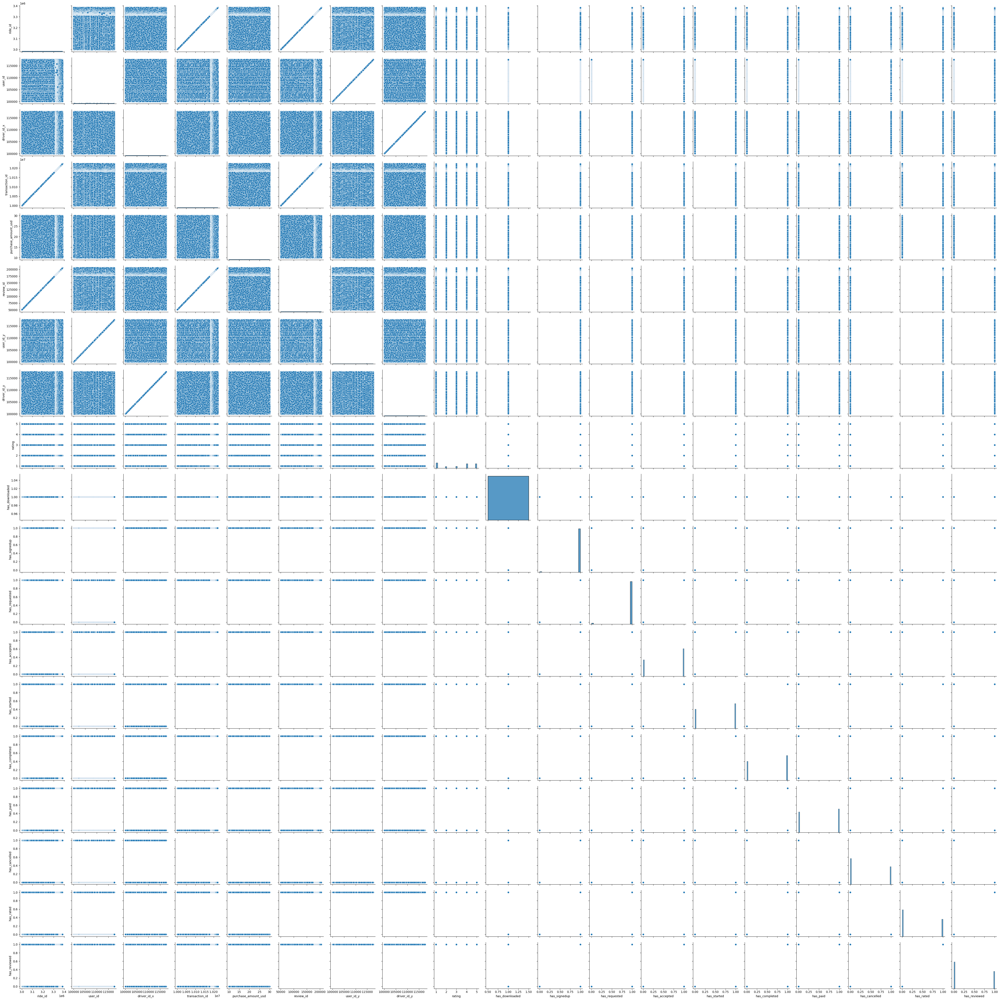

In [ ]:
sns.pairplot(base_table)